# What is an API?

An Application Programming Interface (API) is software that enables communication between two components, typically on different computers. For simplicity, we'll refer to a client and a server as the two different software components. Many API's are configured such that the client submits information to the server via a query string at the end of a Uniform Resource Locator (URL). The server receives the URL, parses the query string, runs a script to gather requested information often by querying a relational database, and returns the data to the client in the requested format. Example formats include html, xml, json, or plain text.

A primary benefit of API's is that users can retrieve information from the database using intuitive query string parameters, without requiring users to understand the structure of the database. Furthermore, databases are generally configured to reject connections originating from another computer for security reasons. The API is a middle-layer that allows users to submit a request to the server, but the query itself then originates from the same server that hosts the database.

# Authentication, Authorization, Keys, and Tokens

Authentication verifies the identity of a user, generally by entering a username and password, and sometimes through additional measures like multi-factor authentication. When a user authenticates through a website, the server may store information about that user in a manner that persists through the user session. 

Authorization determines the access rights extended to a user. For example, a particular user may have access to only their own data when they log in to a website, but they are not permitted to see other users' data.

API's are often stateless, meaning that the server does not store any information about the client session on the server-side. As a result, the request submitted by the client must contain all of the necessary information for the server to verify that the user is authorized to make the request. This is often achieved using keys and/or tokens, which are text strings that are generated by the server and provided to the user. The user must then pass the key or token from the client to the server as part of their request.

API keys are designed to identify the client to the server. In some cases you may need to request a key for a particular API. This often requires you to create an account and authenticate. Generally that key will remain the same and you'll need to include it with your API requests. Note that you typically do not need to authenticate each time a request is made. Simply including the key is adequate.

Tokens are similar to keys in that they are text strings, but they often carry additional information required to authorize the user (i.e., the token bearer). Tokens are often generated when a user authenticates, and set to expire after a specified time period, at which point the user must re-authenticate to obtain a new token.

# Example API Interaction: NASA Astronomy Picture of the Day

NASA maintains a number of open API's to make NASA data, including imagery, available to the public. Here we focus on the Astronomy Picture of the Day, or APOD. Many of NASA's API's require an API key, which can be obtained by signing up through their form at https://api.nasa.gov/. We have elected to use APOD because a demo key can be used to retrieve photos. Therefore this example will work for users who do not have a NASA API token. Below is an example query.

https://api.nasa.gov/planetary/apod?api_key=DEMO_KEY

If you click on the link above, or paste the URL in your web browser, you will see a JSON string that contains information about the image, including a copyright, date, explanation, hdurl, media_type, service_version, title, and url. The JSON string looks like a Python dictionary, and may easily be converted to one using the Python JSON package. While entering the URL into a web browser returns useful information in the form of the JSON string, it does not actually display the image. Rather, the hdurl or url fields contain links to the image, and users could click these links to view the image. But the real power of the API is unlocked by interacting with it programatically rather than through a browser window. 

## Using Python requests to make API calls

The example code below uses the Python requests package to submit the request to the APOD server. The returned JSON is then parsed using the json package to retrieve relevant fields. Python packages requests, io, and PIL are then used to open the image and display it along with its explanation. 

### Required Python packages:
io  
json  
requests  
pillow  

Links to the documentation for these packages are provided below.

https://docs.python.org/3/library/io.html  

https://docs.python.org/3/library/json.html  

https://requests.readthedocs.io/en/latest/  

https://pillow.readthedocs.io/en/stable/  



In [2]:
# Step 1: import packages
import requests
import json
from PIL import Image
from io import BytesIO

# Step 2: Submit API request and assign returned data to a variable called r. We are using DEMO_KEY here for our API key.
# If you have your own API key, you can replace "DEMO_KEY" with your own key here.

r = requests.get('https://api.nasa.gov/planetary/apod?api_key=DEMO_KEY')

# Step 3: Display variable r. If the request was successful, you should see <Response [200]>.
print(r)

<Response [200]>


 # HTTP Status Codes
 
By default, the print(r) command above contains information about the HTTP status code, which indicates whether the request was succesful. A successful request will result in a 3-digit HTTP status code beginning with 2 (i.e., 2xx), with "Response \[200\]" indicating that the request was successful. Status code 1xx means that the request was received but has not yet been processed, 3xx means that the user must take additional action to complete the request, 4xx indicates a client error, and 5xx indicates that the server failed to fulfill a request
 
 More about HTTP status codes: https://en.wikipedia.org/wiki/List_of_HTTP_status_codes 

In [6]:
#Step 4: Display the text of variable r. If the request was successful, you should see a JSON string.
if(r.status_code == 200):
    print(r.text)
else:
    print('Request was not successful. Status code = ' + str(r.status_code))

{"copyright":"Gianni Lacroce","date":"2023-05-15","explanation":"From afar, the whole thing looks like an eagle.  A closer look at the Eagle Nebula, however, shows the bright region is actually a window into the center of a larger dark shell of dust.  Through this window, a brightly-lit workshop appears where a whole open cluster of stars is being formed.  In this cavity, tall pillars and round globules of dark dust and cold molecular gas remain where stars are still forming.  Already visible are several young bright blue stars whose light and winds are burning away and pushing back the remaining filaments and walls of gas and dust.  The Eagle emission nebula, tagged M16, lies about 6500 light years away, spans about 20 light-years, and is visible with binoculars toward the constellation of the Serpent (Serpens).  This picture involved long and deep exposures and combined three specific emitted colors emitted by sulfur (colored as yellow), hydrogen (red), and oxygen (blue).","hdurl":"h

In [7]:
# Step 5: Convert the JSON string to a python dictionary using the json package
r_dict = json.loads(r.text)

# Step 6: Extract explanation and hdurl fields from r_dict
title = r_dict['title']
explanation = r_dict['explanation']
hdurl = r_dict['hdurl']
copyright = r_dict['copyright']

print('title: ' + title)
print('explanation: ' + explanation)
print('hdurl: ' + hdurl)
print('copyright: ' + copyright)

title: M16: Eagle Nebula Deep Field
explanation: From afar, the whole thing looks like an eagle.  A closer look at the Eagle Nebula, however, shows the bright region is actually a window into the center of a larger dark shell of dust.  Through this window, a brightly-lit workshop appears where a whole open cluster of stars is being formed.  In this cavity, tall pillars and round globules of dark dust and cold molecular gas remain where stars are still forming.  Already visible are several young bright blue stars whose light and winds are burning away and pushing back the remaining filaments and walls of gas and dust.  The Eagle emission nebula, tagged M16, lies about 6500 light years away, spans about 20 light-years, and is visible with binoculars toward the constellation of the Serpent (Serpens).  This picture involved long and deep exposures and combined three specific emitted colors emitted by sulfur (colored as yellow), hydrogen (red), and oxygen (blue).
hdurl: https://apod.nasa.go

In [8]:
# Step 7. Retrieve image using Python requests package and open the image using the PIL Image method
r_img = requests.get(hdurl)
img = Image.open(BytesIO(r_img.content))

Title: M16: Eagle Nebula Deep Field
Copyright: Gianni Lacroce


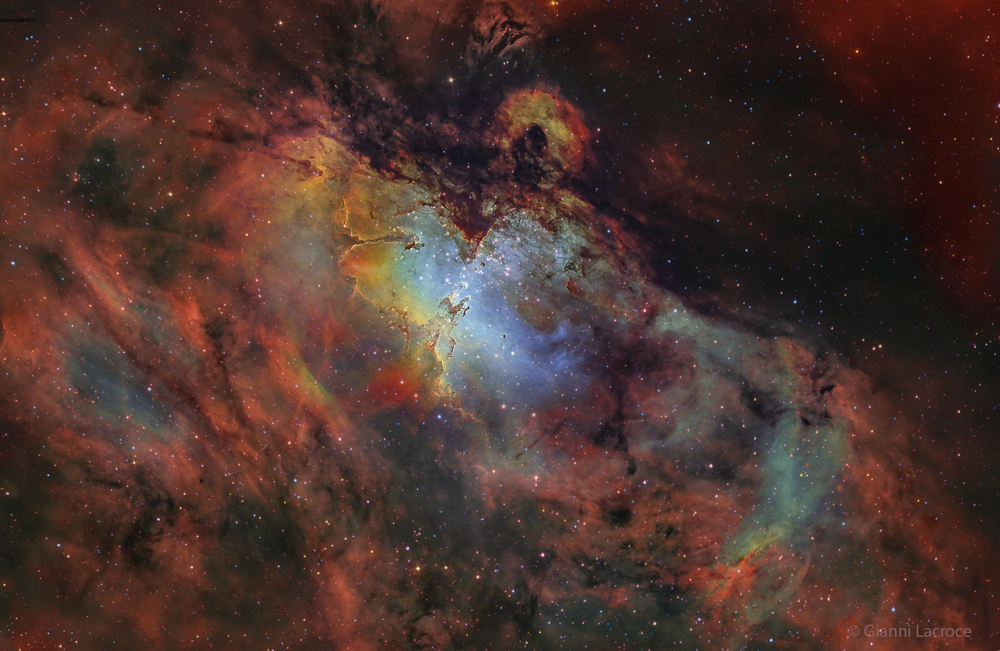

Explanation: From afar, the whole thing looks like an eagle.  A closer look at the Eagle Nebula, however, shows the bright region is actually a window into the center of a larger dark shell of dust.  Through this window, a brightly-lit workshop appears where a whole open cluster of stars is being formed.  In this cavity, tall pillars and round globules of dark dust and cold molecular gas remain where stars are still forming.  Already visible are several young bright blue stars whose light and winds are burning away and pushing back the remaining filaments and walls of gas and dust.  The Eagle emission nebula, tagged M16, lies about 6500 light years away, spans about 20 light-years, and is visible with binoculars toward the constellation of the Serpent (Serpens).  This picture involved long and deep exposures and combined three specific emitted colors emitted by sulfur (colored as yellow), hydrogen (red), and oxygen (blue).


In [9]:
# Step 8. Display the image and explanation
print('Title: ' + title)
print('Copyright: ' + copyright)
img.show()
print('Explanation: ' + explanation)

## Putting it together into a single cell

Title: M16: Eagle Nebula Deep Field
Copyright: Gianni Lacroce


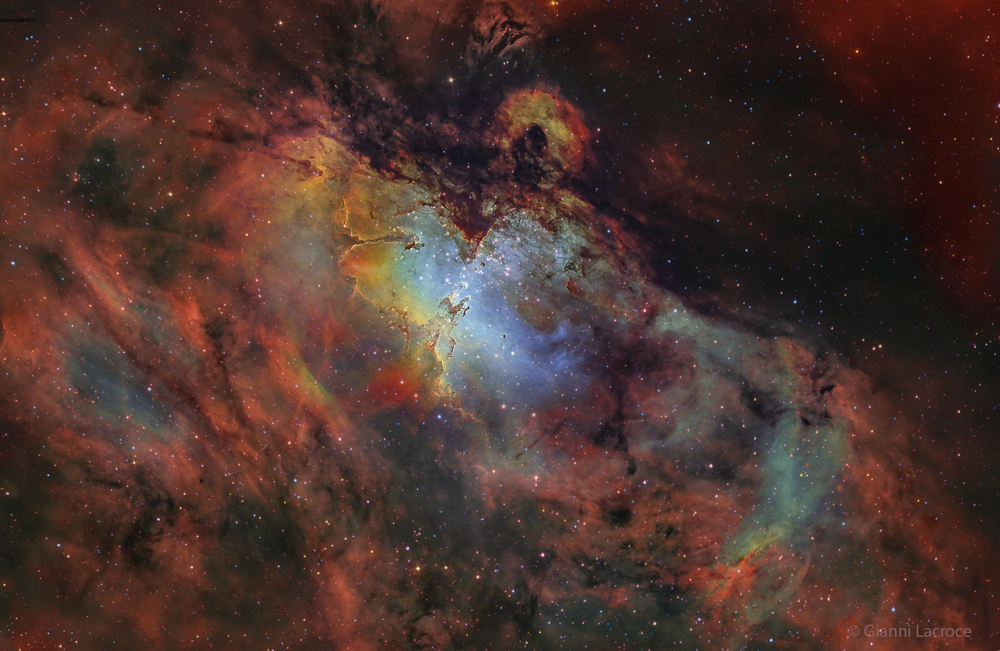

Explanation: From afar, the whole thing looks like an eagle.  A closer look at the Eagle Nebula, however, shows the bright region is actually a window into the center of a larger dark shell of dust.  Through this window, a brightly-lit workshop appears where a whole open cluster of stars is being formed.  In this cavity, tall pillars and round globules of dark dust and cold molecular gas remain where stars are still forming.  Already visible are several young bright blue stars whose light and winds are burning away and pushing back the remaining filaments and walls of gas and dust.  The Eagle emission nebula, tagged M16, lies about 6500 light years away, spans about 20 light-years, and is visible with binoculars toward the constellation of the Serpent (Serpens).  This picture involved long and deep exposures and combined three specific emitted colors emitted by sulfur (colored as yellow), hydrogen (red), and oxygen (blue).


In [10]:
import requests
import json
from PIL import Image
from io import BytesIO

# Submit API request and assign returned data to a variable called r
r = requests.get('https://api.nasa.gov/planetary/apod?api_key=DEMO_KEY')

if(r.status_code != 200):
    print('Request unsuccessful. Status code = ' + str(r.status_code))
else:
    # Convert returned JSON string into a Python dictionary using the json package
    r_dict = json.loads(r.text)

    # Extract explanation and URL for HD version of image
    title = r_dict['title']
    explanation = r_dict['explanation']
    hdurl = r_dict['hdurl']
    copyright = r_dict['copyright']

    r_img = requests.get(hdurl)
    img = Image.open(BytesIO(r_img.content))
    print('Title: ' + title)
    print('Copyright: ' + copyright)
    img.show()
    print('Explanation: ' + explanation)

## Alternative method of passing api_key as a query string parameter

The NASA APOD API includes the API key as a query string parameter, which is the portion of the URL that comes after the "?" symbol. Some API's require keys or tokens to be passed in a different manner that is more secure. The code below shows how to bind the query string parameters to the URL using Python requests. In the end, this is no more secure than simply putting the API key at the end of the query string, but it demonstrates a key functionality of the Python requests package. More secure implementations might use the HTTPBasicAuth() functionality in the Python requests package, or a POST request instead of GET. 

Title: M16: Eagle Nebula Deep Field
Copyright: Gianni Lacroce


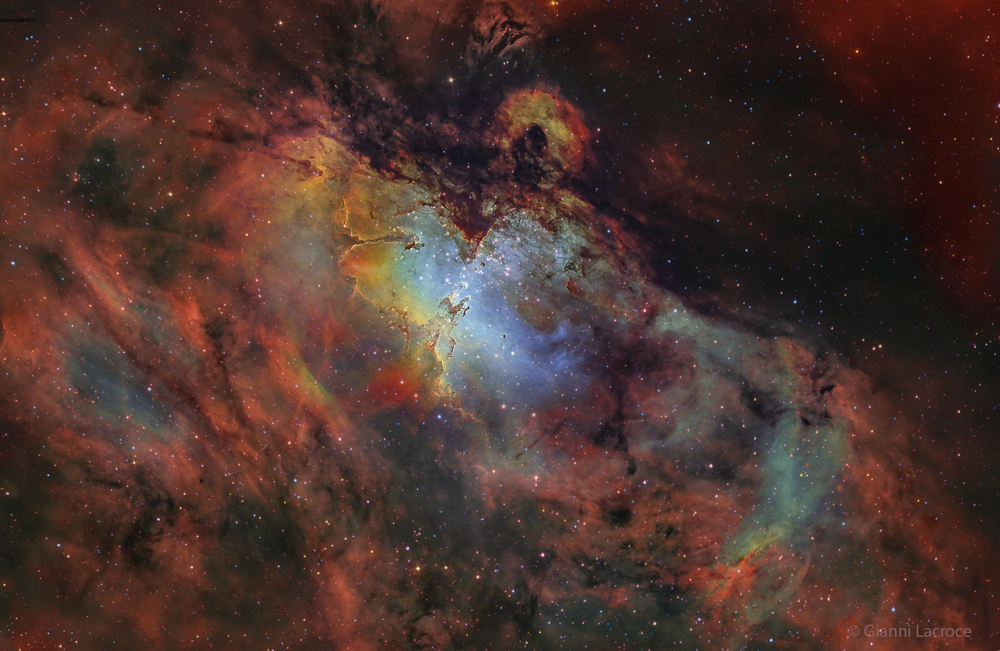

Explanation: From afar, the whole thing looks like an eagle.  A closer look at the Eagle Nebula, however, shows the bright region is actually a window into the center of a larger dark shell of dust.  Through this window, a brightly-lit workshop appears where a whole open cluster of stars is being formed.  In this cavity, tall pillars and round globules of dark dust and cold molecular gas remain where stars are still forming.  Already visible are several young bright blue stars whose light and winds are burning away and pushing back the remaining filaments and walls of gas and dust.  The Eagle emission nebula, tagged M16, lies about 6500 light years away, spans about 20 light-years, and is visible with binoculars toward the constellation of the Serpent (Serpens).  This picture involved long and deep exposures and combined three specific emitted colors emitted by sulfur (colored as yellow), hydrogen (red), and oxygen (blue).


In [12]:
import requests
import json
from PIL import Image
from io import BytesIO

# Prepare URL and query string parameters
url = 'https://api.nasa.gov/planetary/apod'
params = {'api_key':'DEMO_KEY'}

# Submit API request and assign returned data to a variable called r
r = requests.get(url, params=params)

if(r.status_code != 200):
    print('Request unsuccessful. Status code = ' + str(r.status_code))
else:
    # Convert returned JSON string into a Python dictionary using the json package
    r_dict = json.loads(r.text)

    # Extract explanation and URL for HD version of image
    title = r_dict['title']
    explanation = r_dict['explanation']
    hdurl = r_dict['hdurl']
    copyright = r_dict['copyright']

    r_img = requests.get(hdurl)
    img = Image.open(BytesIO(r_img.content))
    print('Title: ' + title)
    print('Copyright: ' + copyright)
    img.show()
    print('Explanation: ' + explanation)